In [1]:
from collections import Counter
import yaml
import pandas as pd
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from scipy.spatial.distance import pdist, squareform
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import VarianceThreshold
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.preprocessing import StandardScaler

In [2]:
%run data_clean_and_join.py

Using file: bin/nsmo_v50_1321_puf.csv
Using file: bin/nsmo_v50_1321_puf.csv


In [3]:
%run train_test_split.py

In [4]:
df = pd.read_csv('bin/cleaned_and_joined.csv')

In [5]:
df.head()

,nsmoid,survey_wave,analysis_weight,x74r,rate_spread,pmms,term,ltv,cltv,dti,...,forb0922_1,forb0922_2,forb1222_1,forb1222_2,forb0323_1,forb0323_2,forb0623_1,forb0623_2,forb0923_1,forb0923_2
0,509550.0,1.0,1207.58,28.0,0.93,2.70,30.0,73.0,73.0,49.0,...,False,False,False,False,False,False,False,False,False,False
1,503017.0,1.0,1207.58,52.0,0.21,3.42,30.0,78.0,78.0,37.0,...,False,False,False,False,False,False,False,False,False,False
2,514904.0,1.0,1027.74,57.0,0.13,3.37,30.0,58.0,58.0,39.0,...,False,False,False,False,False,False,False,False,False,False
3,525176.0,1.0,1711.91,29.0,2.53,2.60,15.0,125.0,125.0,65.0,...,False,False,False,False,False,False,False,False,False,False
4,540654.0,1.0,918.85,74.0,0.61,2.52,3.0,9.0,9.0,29.0,...,False,False,False,False,False,False,False,False,False,False


In [6]:
# Reading variables labels from the data cleaning pipeline
with open('variable_labels.yaml', 'r', encoding='utf-8') as file:
    variable_labels_dict = yaml.safe_load(file)

# Identifying Survey Features

Keeping only those variables that start with 'x'

In [7]:
df = df.loc[:, df.columns.str.startswith('x')]

In [8]:
df.columns

Index(['x74r', 'x05a_1', 'x05a_2', 'x05a_3', 'x05b_1', 'x05b_2', 'x05b_3',
       'x05c_1', 'x05c_2', 'x05c_3',
       ...
       'x94a_3', 'x94b_1', 'x94b_2', 'x94b_3', 'x94c_1', 'x94c_2', 'x94c_3',
       'x94d_1', 'x94d_2', 'x94d_3'],
      dtype='object', length=781)

In [9]:
# Identifying questions that changed significantly and dropping them from the dataset
# These questions impair clustering as they lead to cluster by survey waves
# Data cannot be aggregated as question and answer structure varied significantly across waves

df = df[[col for col in df.columns if col.count('_') < 2]]



In [10]:
# Creating new sub DataFrame with survey data
#survey_df = df[survey_columns]
survey_df=df.copy()

In [11]:
# Check for null values
print(f'Null values in survey data: {survey_df.isnull().any(axis=1).sum()}')

Null values in survey data: 0


In [12]:
# Identifying binary questions in survey data and removing no's for
# methods that assume non-linear dependence like PCA
column_list = survey_df.columns.to_list()
column_list = [column[:-2] for column in column_list]

counts = Counter(column_list)

binary_columns = [v for v in counts.keys() if counts[v] == 2]
binary_column_no = [col + '_2' for col in binary_columns]
survey_df_dropped_no = survey_df.drop(binary_column_no, axis=1)

In [13]:
survey_df_dropped_no.shape

(50542, 517)

# Helper Functions used throughout the notebook

In [14]:
def question_answer(q, label_dict=variable_labels_dict):
    '''Function that accepts a string representing the one_hot_encoded column label
    and returns the survey question and response as a tuple using YAML survey labels'''
    question_key = q[:-2]
    answer = q[-1:]
    question = question_key + ' ' + label_dict[question_key]

    return question, answer



In [15]:
def get_tsne(X):
    tsne = TSNE(n_components=2, random_state=42)
    return tsne.fit_transform(X)

# Normalization of Input Data

Not required as all values are one_hot_encoded bools

In [16]:
survey_df_scaled = StandardScaler().fit_transform(survey_df)
survey_df_dropped_no_scaled = StandardScaler().fit_transform(survey_df_dropped_no)

# PCA To Improve Cluster Performance

80% of variance and 10 components

In [17]:
def pca_clustering(X, n):
    pca = PCA(n_components=n, random_state=42)

    X_transformed = pca.fit_transform(X)

    return X_transformed, pca


In [18]:
def feature_importance(pca, feature_names, top=10):
    all_top_indicies = Counter()
    for component in pca.components_:
        top_indices = np.abs(component).argsort()[::-1][:top]
        all_top_indicies.update(top_indices)
    top_names = {feature_names[key]: value for key, value in all_top_indicies.items()}
    sorted_features = sorted(top_names.items(), key=lambda x: x[1], reverse=True)

    return sorted_features

In [19]:
survey_pc, pca_survey = pca_clustering(survey_df_dropped_no_scaled, .80)

In [20]:
# Checking number of componenents for 80% of variance

print(f'number of componenents = {survey_pc.shape[1]}')

number of componenents = 249


In [21]:
# Checking number of componenents for 80% of variance

print(f'number of componenents = {survey_pc.shape[1]}')

number of componenents = 249


In [22]:
# PCA and obtaining 10 principal components
pc_10, pca_10 = pca_clustering(survey_df_dropped_no_scaled, 10)

In [23]:
print(f'% of variance explained: {pca_10.explained_variance_ratio_.sum()}')

% of variance explained: 0.1719715047111931


# Attempting Different Feature Selection Methods to improve performance

Variance Threshold - Selecting features with a variance threshold of .1


In [24]:
# Using VarianceThreshold of .1 to reduce number of features
selector = VarianceThreshold(1)
variance_thresh_survey = selector.fit_transform(survey_df_dropped_no_scaled)

In [25]:
# Showing substantially reduced number of features
len(selector.get_feature_names_out())

228

In [26]:
# Re-performing PCA to further reduce feature space
variance_thresh_pc, pca_variance_thresh = pca_clustering(variance_thresh_survey, .8)

In [27]:
# Showing further reduced feature space
pca_variance_thresh.n_components_

np.int64(129)

# Clustering Borrowers with KMeans

In [28]:
def kmeans_loop(X,start=2, stop=100,attempts=5):
    """A training loop to identify the best k value"""
    best_score = -1
    best_k = None
    failed_attempts = 0

    for i in range(start, stop+1):
        kmeans = KMeans(n_clusters=i, random_state=42).fit(X)
        score = calinski_harabasz_score(X, kmeans.labels_)
        if score > best_score:
            best_score = score
            best_k = i
            failed_attempts = 0
            print(f'new best: k={i} {score=}')
        else:
            print(f'k={i} not better than k={best_k}')
            failed_attempts += 1
        
        if failed_attempts == attempts:
            break

    return best_score, best_k

In [29]:
kmeans_loop(survey_pc)

new best: k=2 score=np.float64(1643.0738508973557)
k=3 not better than k=2
k=4 not better than k=2
k=5 not better than k=2
k=6 not better than k=2
k=7 not better than k=2


(np.float64(1643.0738508973557), 2)

In [30]:
kmeans_loop(pc_10)

new best: k=2 score=np.float64(7774.728348279588)
new best: k=3 score=np.float64(9213.357392317439)
k=4 not better than k=3
k=5 not better than k=3
k=6 not better than k=3
k=7 not better than k=3
k=8 not better than k=3


(np.float64(9213.357392317439), 3)

Simple scoring clusters has proved ineffective, we will need to employ a more manual approach using visualization of clusters. In our case, we will use tSNE to visualize clusters

In [31]:
kmeans_loop(variance_thresh_pc)

new best: k=2 score=np.float64(1882.3424648171203)
k=3 not better than k=2
k=4 not better than k=2
k=5 not better than k=2
k=6 not better than k=2
k=7 not better than k=2


(np.float64(1882.3424648171203), 2)

In [32]:
def silhouette_comparison_tsne(X, X_embedded=None, start=2, stop=10):
    # tSNE for visualization of clusters
    if X_embedded is None:
        tsne = TSNE(n_components=2, random_state=42)
        X_embedded = tsne.fit_transform(X)
    
    for n_clusters in range(start, stop+1):
        # Create a subplot with 1 row and 2 columns
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)

        # The 1st subplot is the silhouette plot
        # The silhouette coefficient can range from -1, 1 but in this example all
        # lie within [-0.1, 1]
        ax1.set_xlim([-0.1, 1])
        # The (n_clusters+1)*10 is for inserting blank space between silhouette
        # plots of individual clusters, to demarcate them clearly.
        ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

        # Initialize the clusterer with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        clusterer = KMeans(n_clusters=n_clusters, random_state=10)
        cluster_labels = clusterer.fit_predict(X)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed
        # clusters
        silhouette_avg = silhouette_score(X, cluster_labels)
        print(
            "For n_clusters =",
            n_clusters,
            "The average silhouette_score is :",
            silhouette_avg,
        )

        y_lower = 10
        
        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(X, cluster_labels)

        y_lower = 10
        colors = {}
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            colors[i] = color
            ax1.fill_betweenx(
                np.arange(y_lower, y_upper),
                0,
                ith_cluster_silhouette_values,
                facecolor=color,
                edgecolor=color,
                alpha=0.7,
            )

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # 2nd Plot showing the actual clusters formed
        # Assign a color to each point based on its cluster label
        colors = [colors[int(label)] for label in cluster_labels]
        ax2.scatter(X_embedded[:, 0], X_embedded[:, 1], c=colors, alpha=0.7, s=5)
        ax2.set_title('')
        

        plt.suptitle(
            "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
            % n_clusters,
            fontsize=14,
            fontweight="bold",
        )

    plt.show()

In [33]:
base_tsne = get_tsne(survey_df_dropped_no)

In [34]:
survey_tsne = get_tsne(survey_pc)

In [35]:
pc_10_tsne = get_tsne(pc_10)

In [36]:
variance_thresh_tsne = get_tsne(variance_thresh_pc)

For n_clusters = 2 The average silhouette_score is : 0.041284704946463247
For n_clusters = 3 The average silhouette_score is : 0.024800526518403282
For n_clusters = 4 The average silhouette_score is : 0.023722473560027626
For n_clusters = 5 The average silhouette_score is : 0.02183929391027675
For n_clusters = 6 The average silhouette_score is : 0.01921240343904449
For n_clusters = 7 The average silhouette_score is : 0.000798046885035722
For n_clusters = 8 The average silhouette_score is : 0.0024985158228241376
For n_clusters = 9 The average silhouette_score is : 0.0036670611478994645
For n_clusters = 10 The average silhouette_score is : -0.0029742721339182177


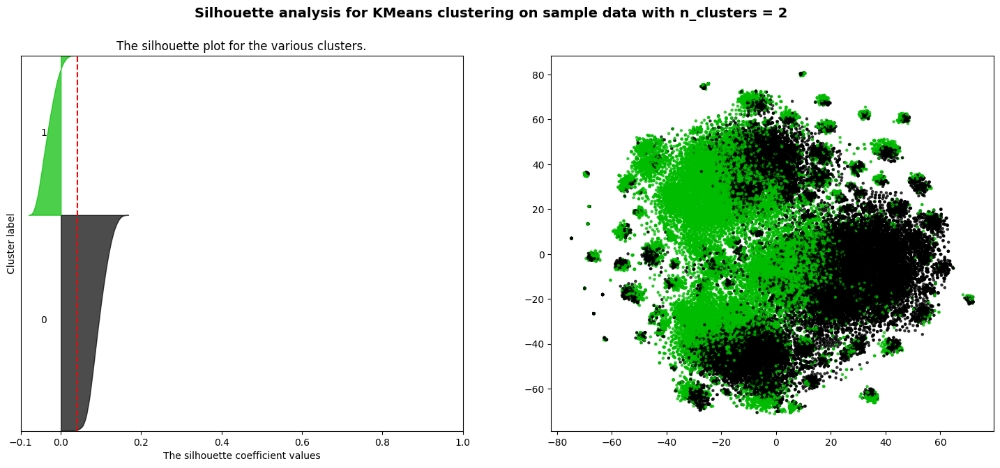

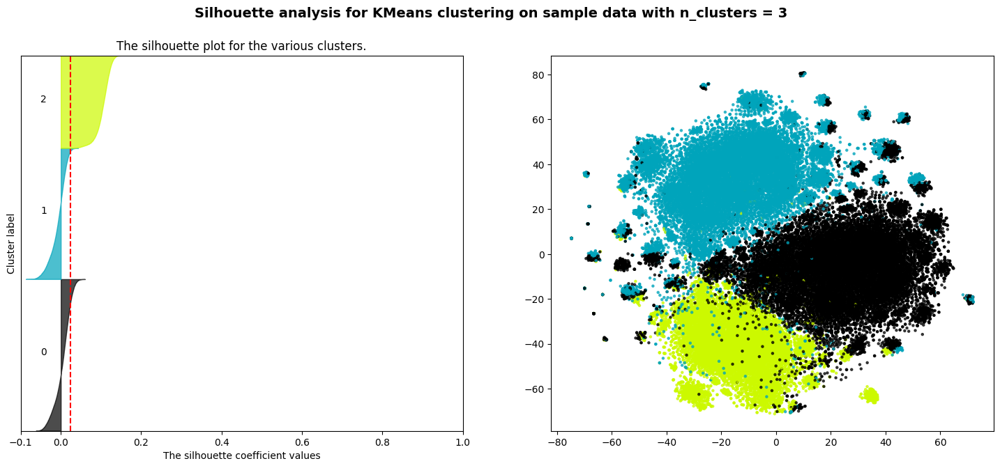

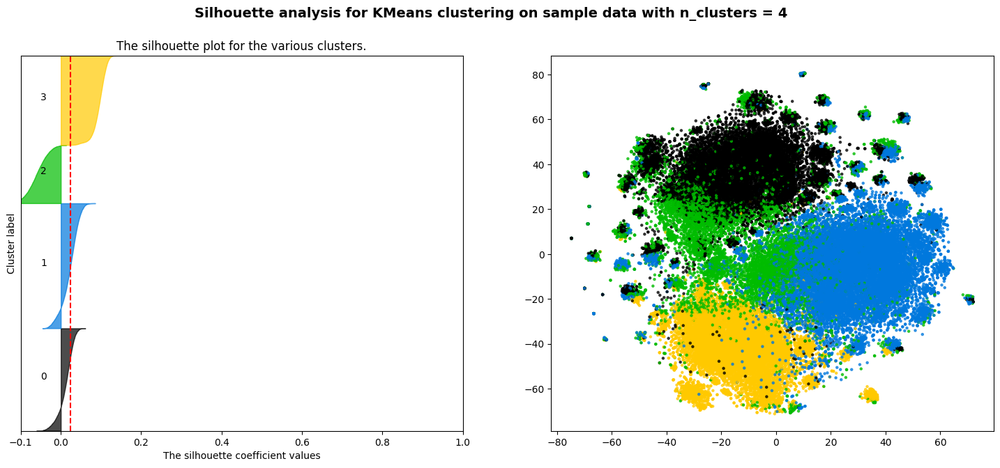

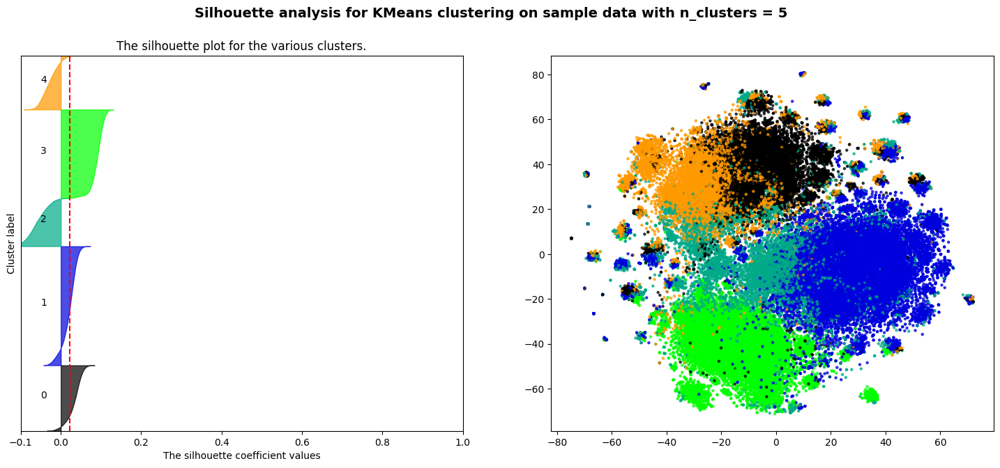

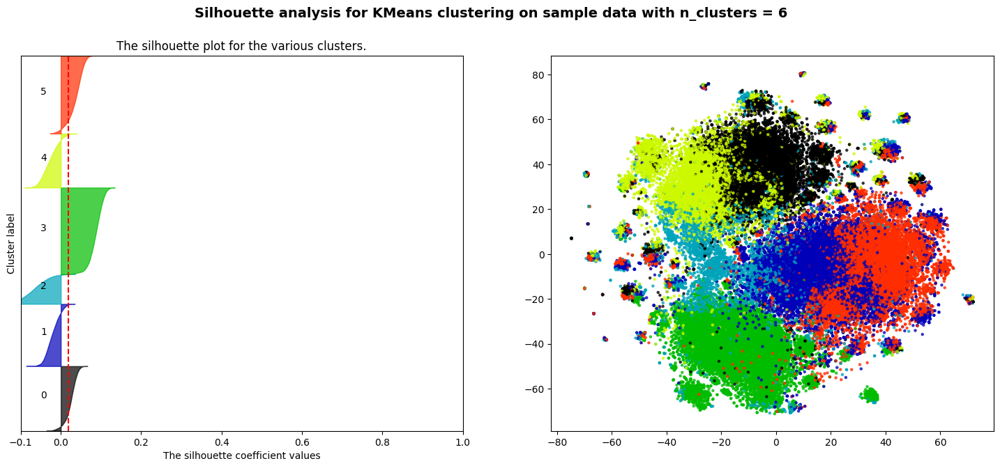

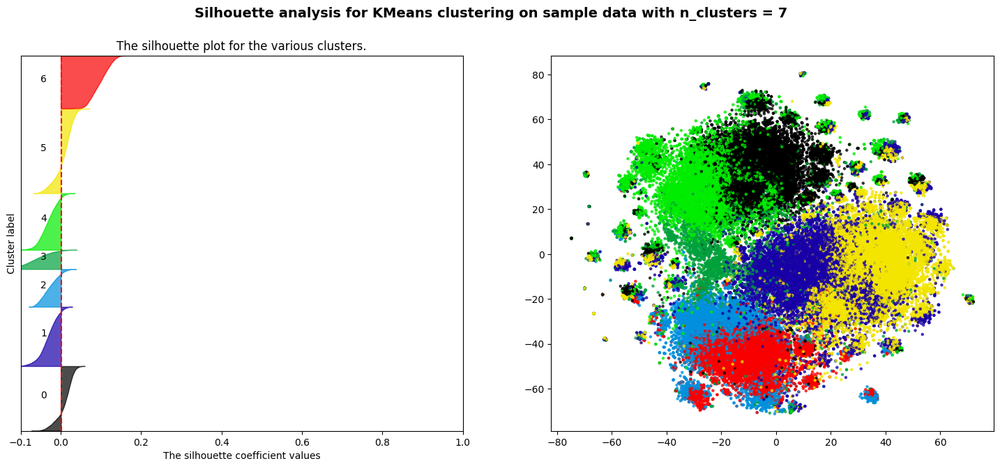

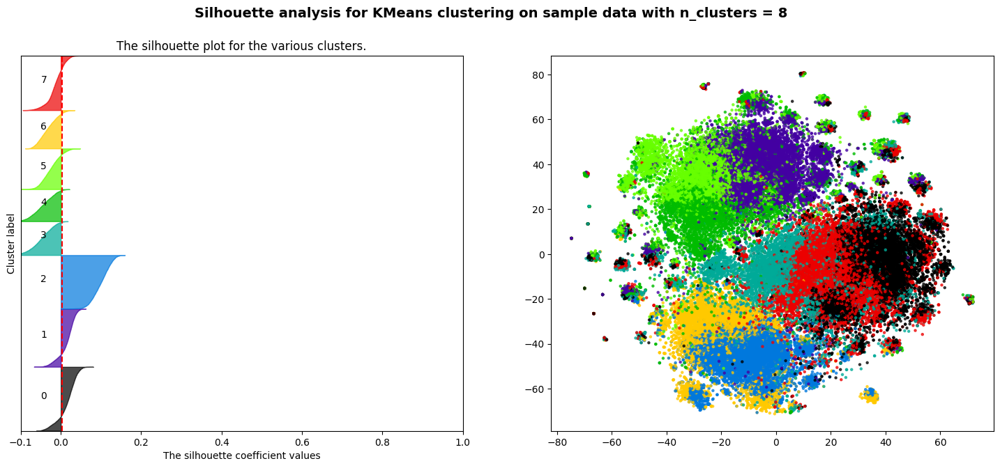

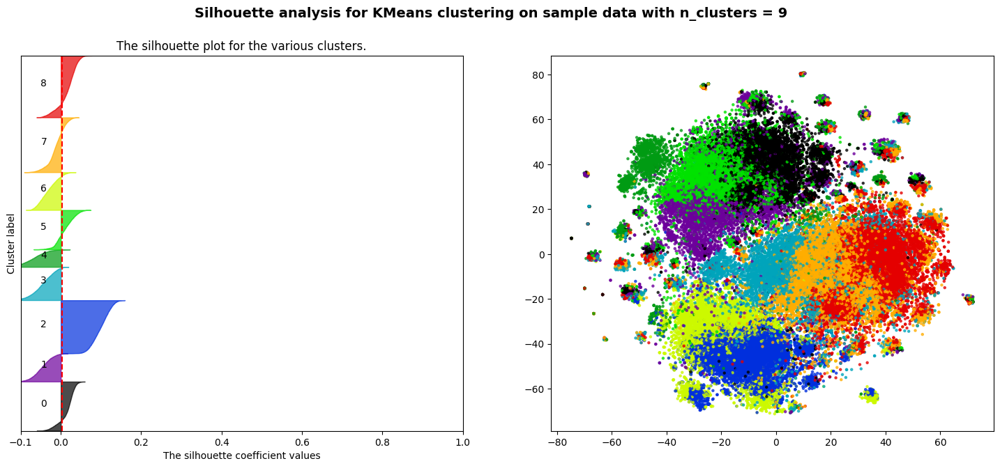

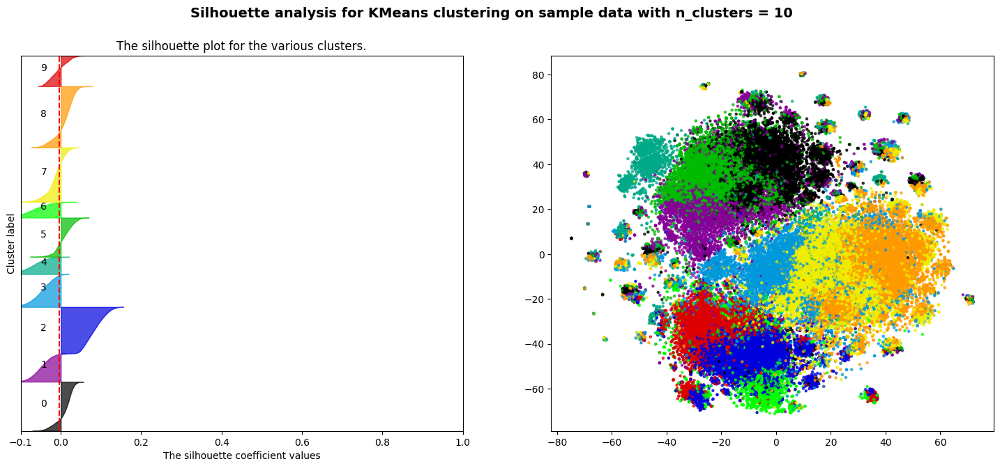

In [37]:
silhouette_comparison_tsne(survey_pc, survey_tsne, 2, 10)

For n_clusters = 2 The average silhouette_score is : 0.15728615022248785
For n_clusters = 3 The average silhouette_score is : 0.18373585835429707
For n_clusters = 4 The average silhouette_score is : 0.17813169404185833
For n_clusters = 5 The average silhouette_score is : 0.15730854605333788
For n_clusters = 6 The average silhouette_score is : 0.14474894884237602
For n_clusters = 7 The average silhouette_score is : 0.13338442301715087
For n_clusters = 8 The average silhouette_score is : 0.13684830820888358
For n_clusters = 9 The average silhouette_score is : 0.13859278744241196
For n_clusters = 10 The average silhouette_score is : 0.13061898343537623


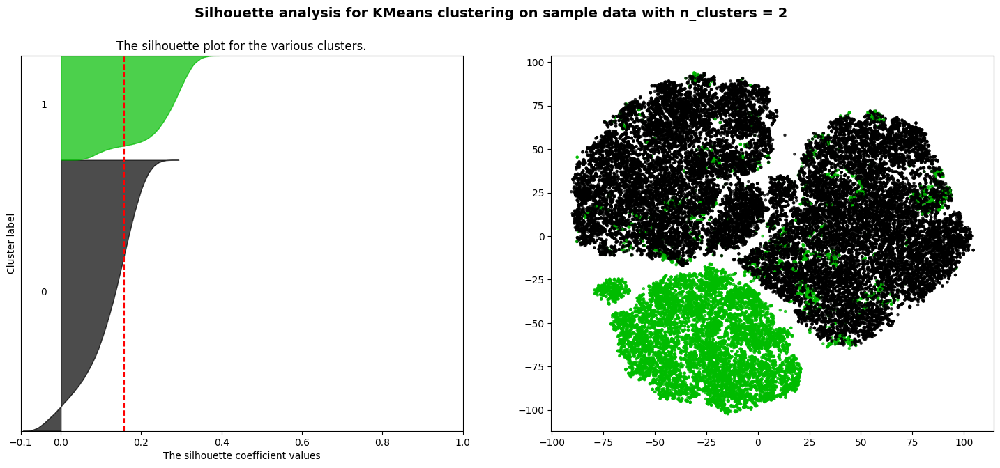

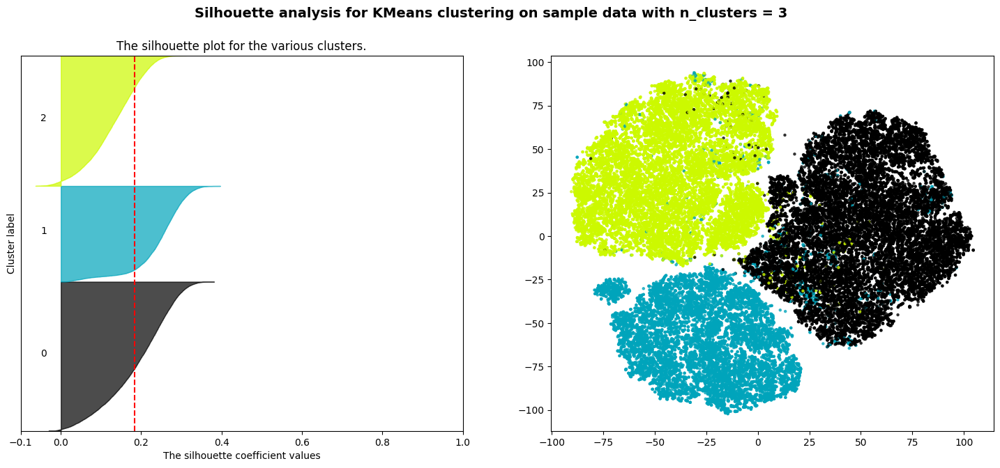

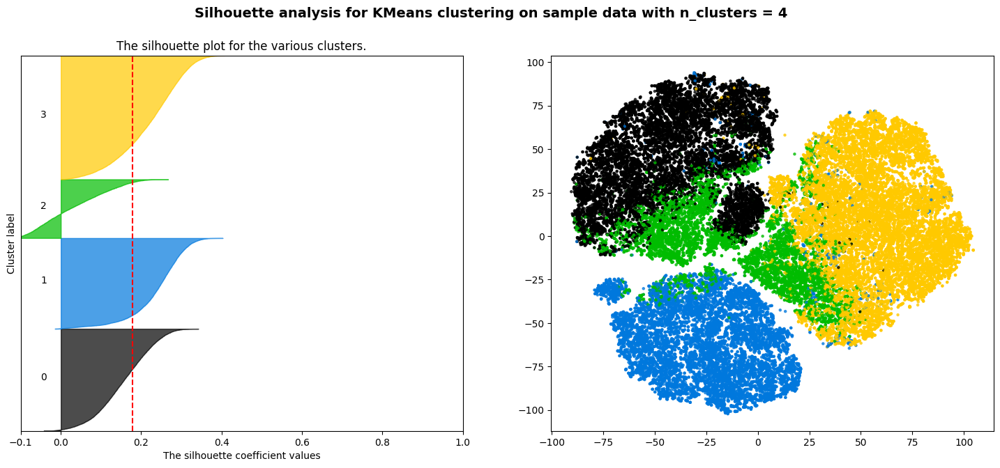

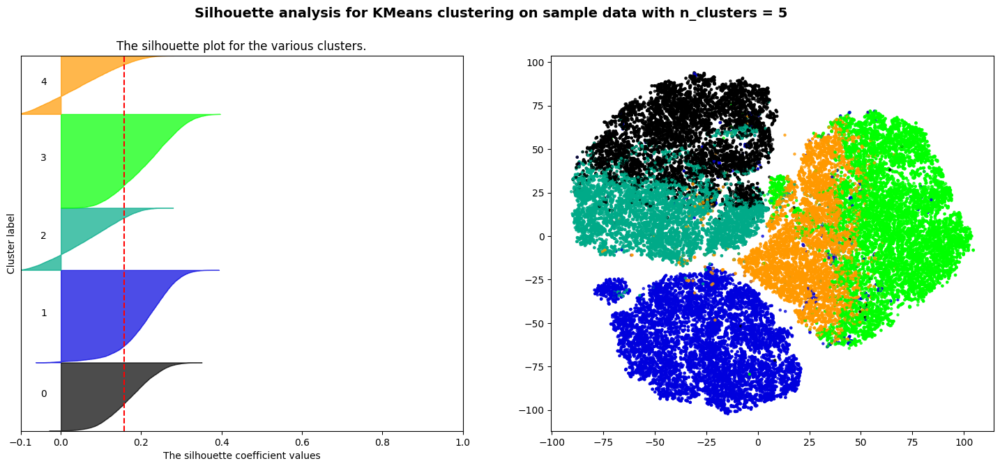

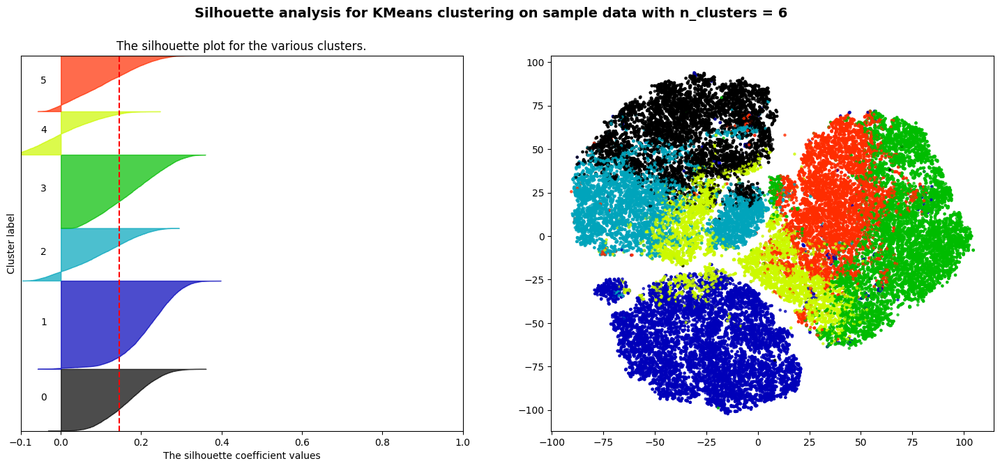

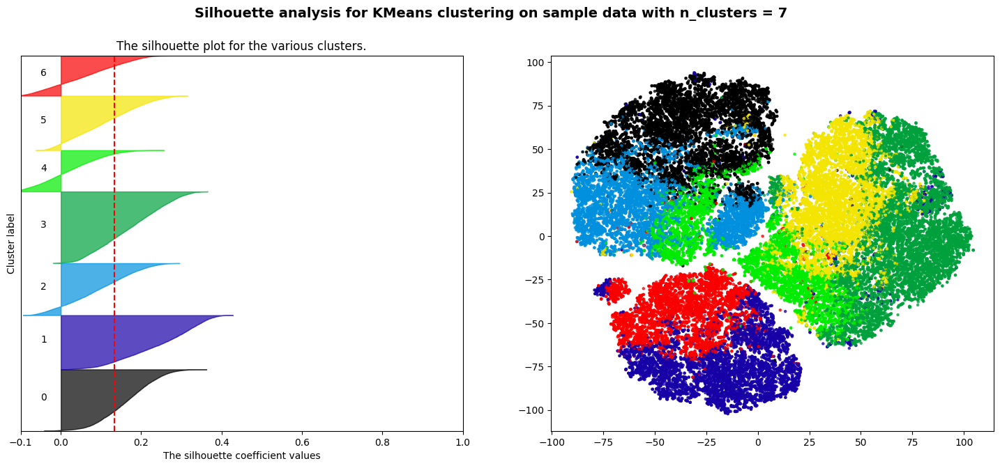

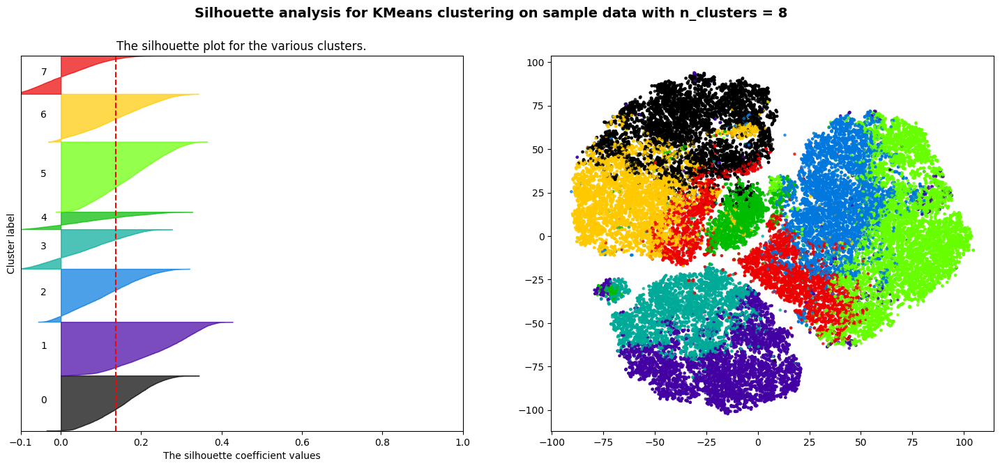

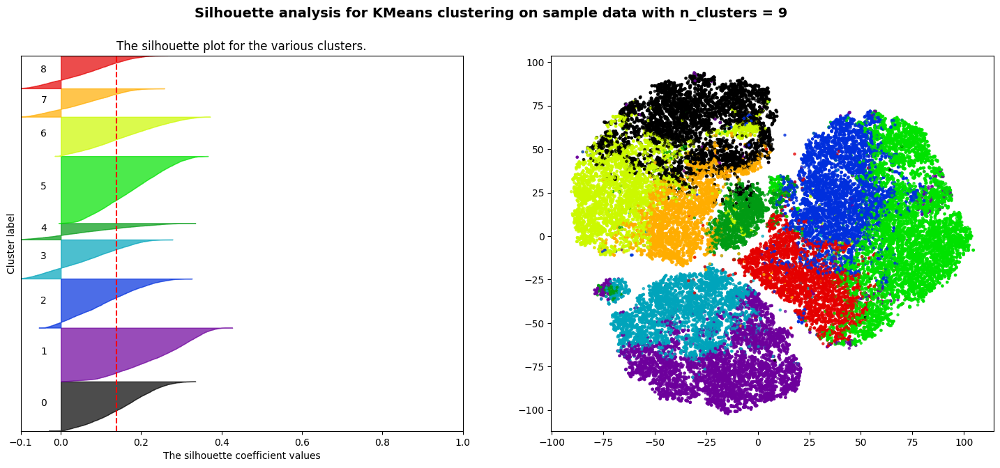

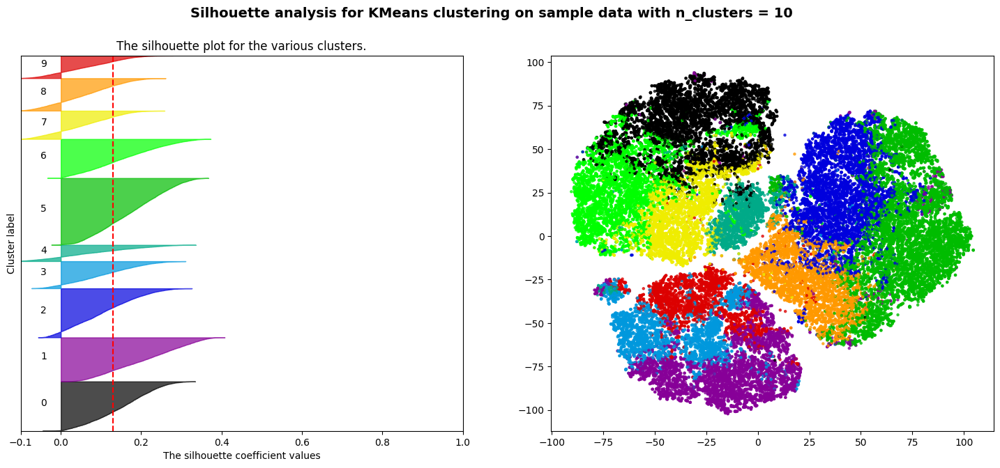

In [38]:
silhouette_comparison_tsne(pc_10, pc_10_tsne, 2, 10)

For n_clusters = 2 The average silhouette_score is : 0.039845957145236734
For n_clusters = 3 The average silhouette_score is : 0.023266950149282453
For n_clusters = 4 The average silhouette_score is : 0.015656052562122002
For n_clusters = 5 The average silhouette_score is : 0.013859892606543208
For n_clusters = 6 The average silhouette_score is : 0.011322317108517343
For n_clusters = 7 The average silhouette_score is : 0.011627270490899526
For n_clusters = 8 The average silhouette_score is : 0.011530966591098793
For n_clusters = 9 The average silhouette_score is : 0.011872658941429007
For n_clusters = 10 The average silhouette_score is : 0.012247241903309804


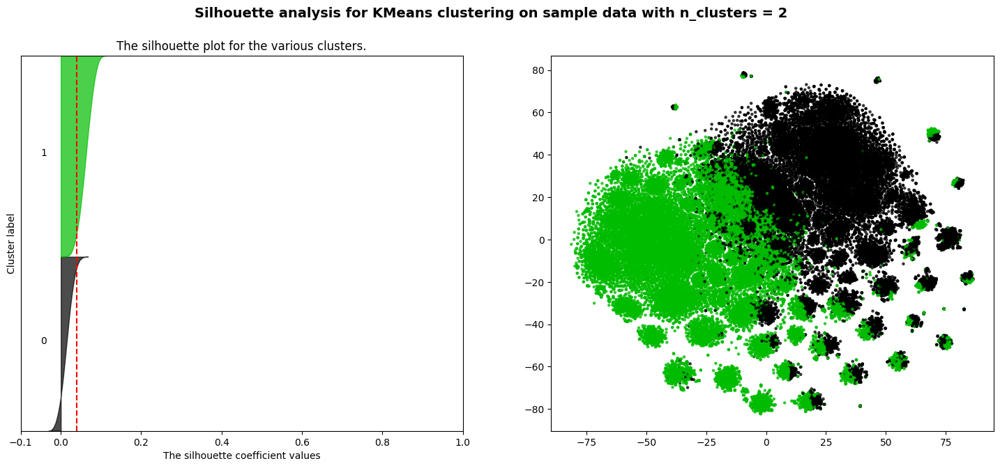

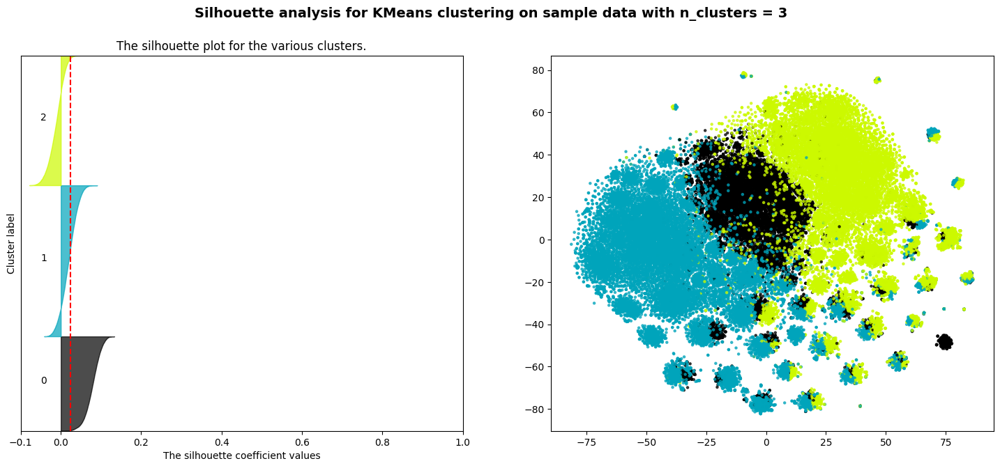

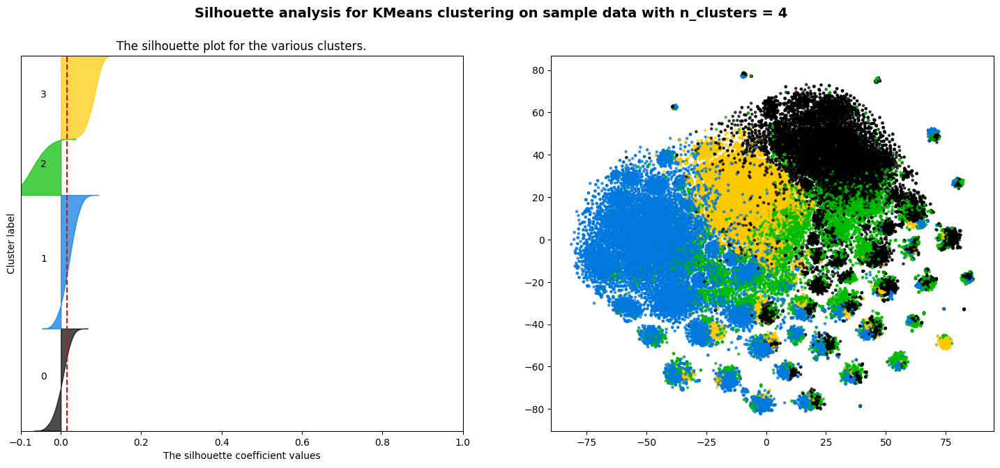

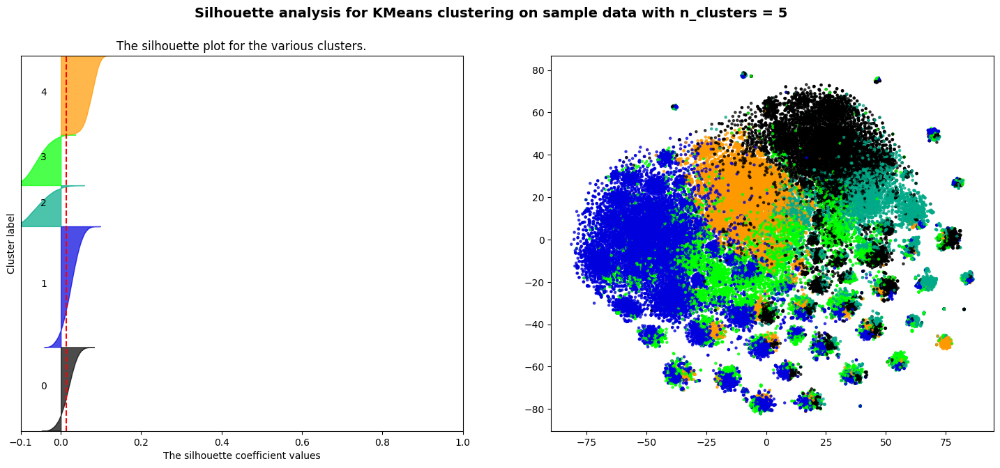

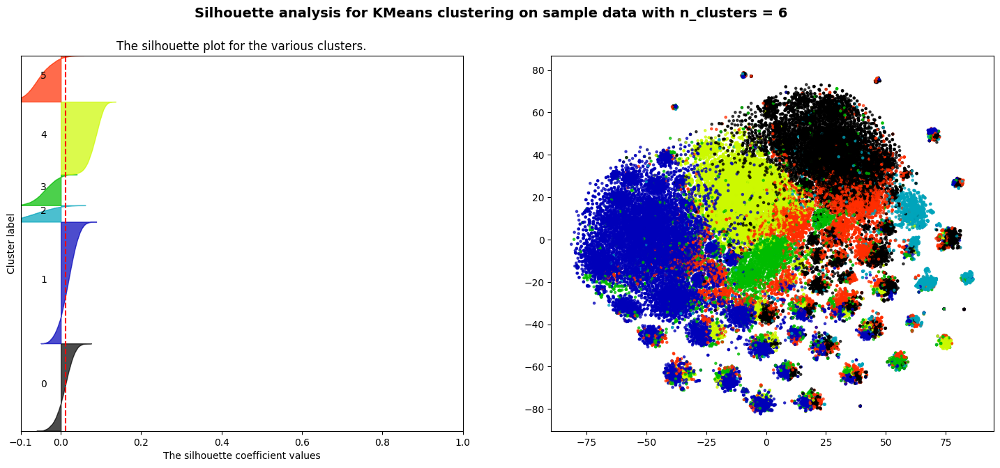

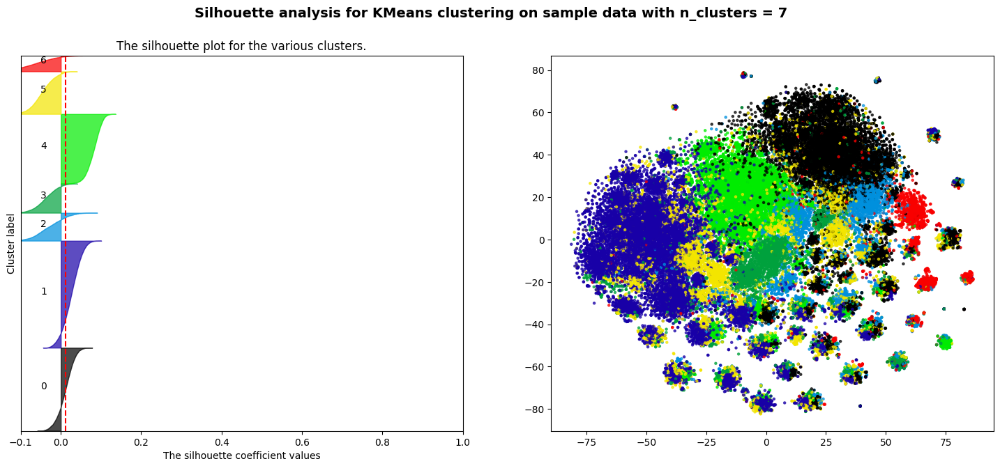

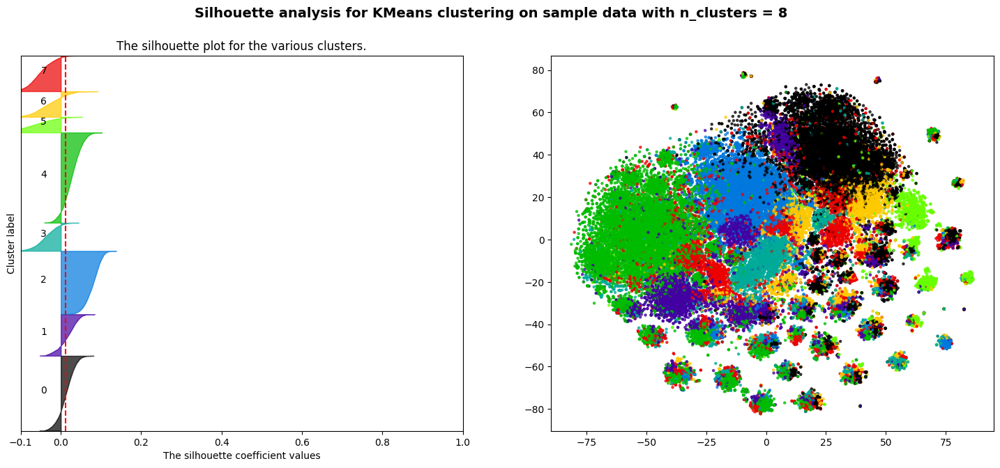

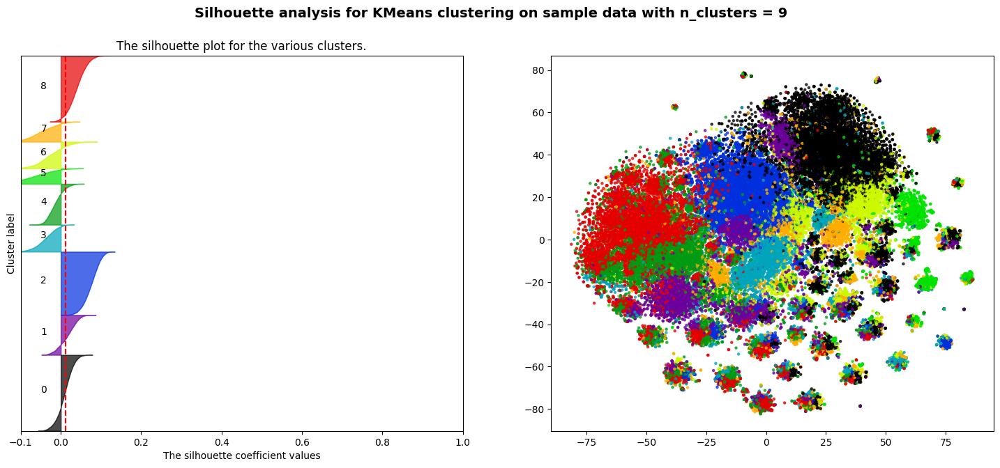

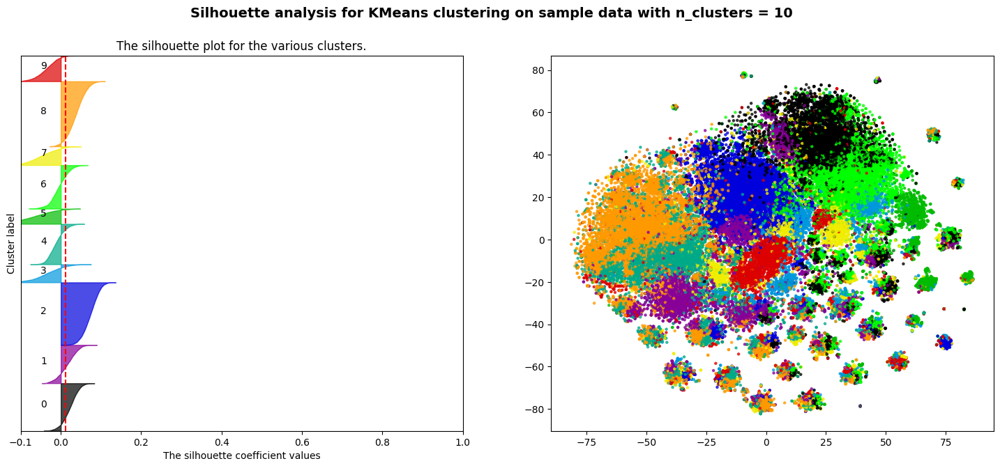

In [39]:
silhouette_comparison_tsne(variance_thresh_pc, variance_thresh_tsne, 2, 10)

# Agglomerative Clustering

Note this utilizes the full survey dataframe with no's as it does not assume linear independence of features

In [40]:
# Compute pairwise cosine distances
distance_vector = pdist(survey_df_dropped_no_scaled, metric='cosine')

In [41]:
# Compute various linkage matricies
survey_Z = linkage(survey_df)
pc_Z = linkage(survey_pc)
pc_10_Z = linkage(pc_10)
variance_thresh_Z = linkage(variance_thresh_pc)
avereage_distance_Z = linkage(distance_vector, method='average')
complete_distance_Z = linkage(distance_vector, method='complete')



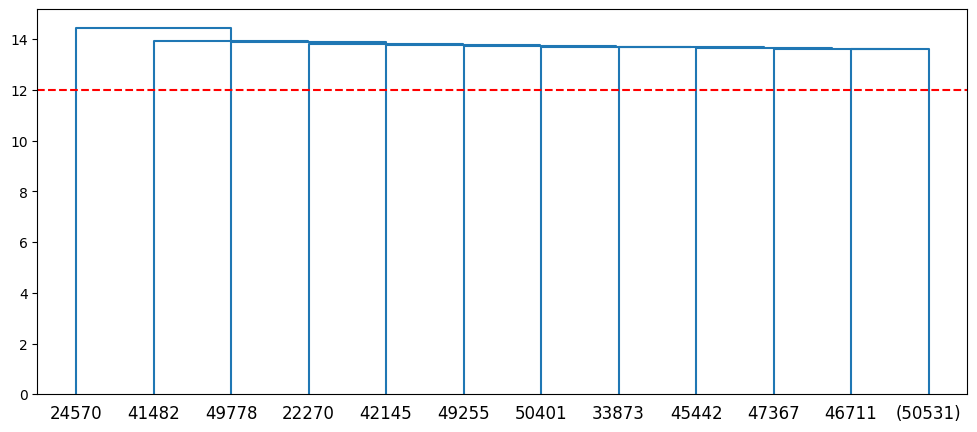

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 1

In [42]:
labels = fcluster(survey_Z, t=12, criterion='distance') - 1 # scipy labels start at 1
elements, counts = np.unique(labels, return_counts=True)

plt.figure(figsize=(12, 5))
dendrogram(survey_Z, truncate_mode='level', p=10)
plt.axhline(y=12, color='r', linestyle='--')  # cut line
plt.show()

np.sort(counts)[::-1][:10]

print(np.unique(labels, return_counts=True))

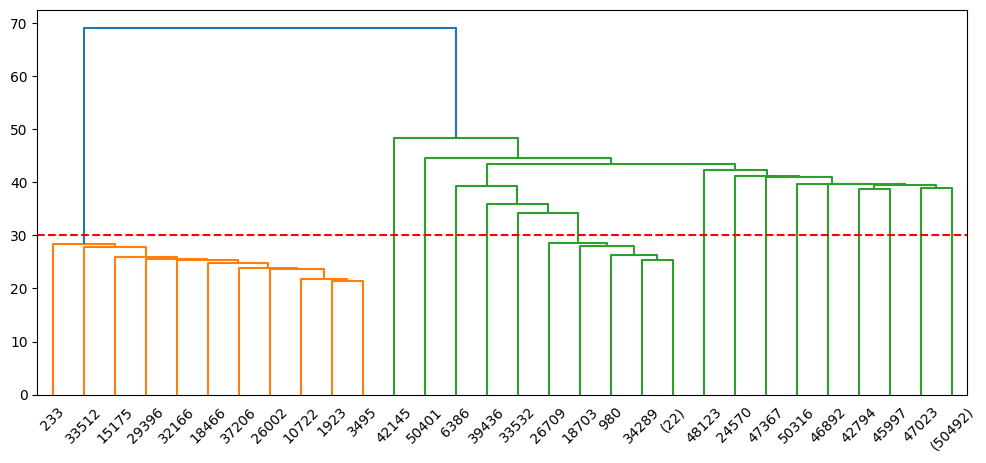

array([50031,    46,    39,    36,    26,    26,    11,     1,     1,
           1])

In [43]:
labels = fcluster(pc_Z, t=30, criterion='distance') - 1 # scipy labels start at 1
elements, counts = np.unique(labels, return_counts=True)

plt.figure(figsize=(12, 5))
dendrogram(pc_Z, truncate_mode='level', p=10)
plt.axhline(y=30, color='r', linestyle='--')  # cut line
plt.show()

np.sort(counts)[::-1][:10]

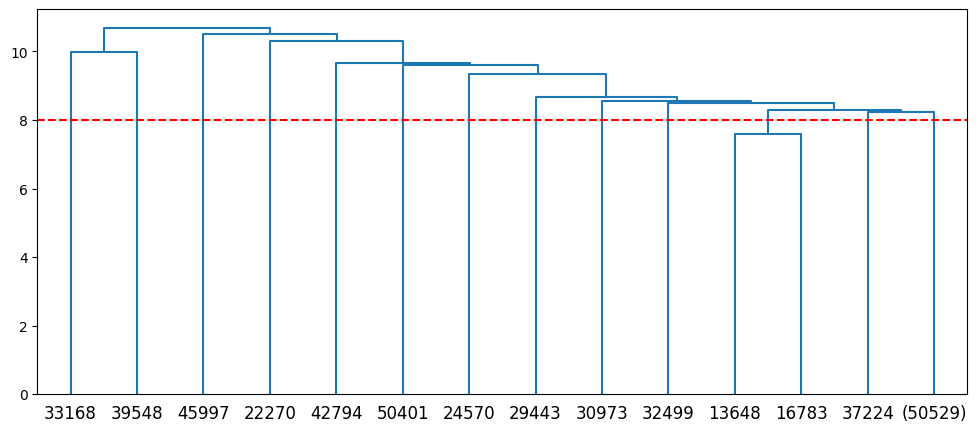

array([50526,     2,     1,     1,     1,     1,     1,     1,     1,
           1])

In [44]:
labels = fcluster(pc_10_Z, t=8, criterion='distance') - 1 # scipy labels start at 1
elements, counts = np.unique(labels, return_counts=True)

plt.figure(figsize=(12, 5))
dendrogram(pc_10_Z, truncate_mode='level', p=10)
plt.axhline(y=8, color='r', linestyle='--')  # cut line
plt.show()

np.sort(counts)[::-1][:10]

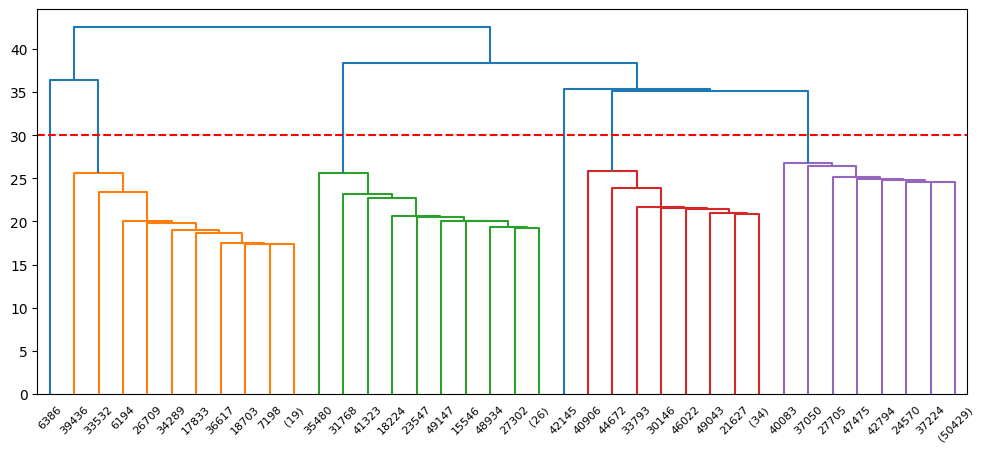

array([50436,    41,    35,    28,     1,     1])

In [45]:
labels = fcluster(variance_thresh_Z, t=30, criterion='distance') - 1 # scipy labels start at 1
elements, counts = np.unique(labels, return_counts=True)

plt.figure(figsize=(12, 5))
dendrogram(variance_thresh_Z, truncate_mode='level', p=10)
plt.axhline(y=30, color='r', linestyle='--')  # cut line
plt.show()

np.sort(counts)[::-1][:10]

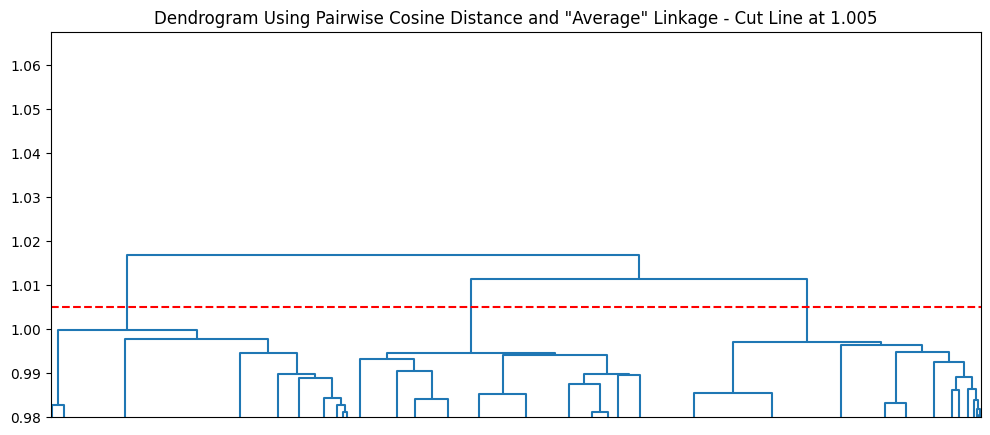

array([19574, 17025, 13943])

In [46]:
average_dist_labels = fcluster(avereage_distance_Z, t=1.005, criterion='distance') - 1 # scipy labels start at 1
elements, counts = np.unique(average_dist_labels, return_counts=True)

plt.figure(figsize=(12, 5))
dendrogram(avereage_distance_Z, truncate_mode='level', p=10)
plt.axhline(y=1.005, color='r', linestyle='--')  # cut line
plt.xticks([])
plt.ylim(.98)
plt.title('Dendrogram Using Pairwise Cosine Distance and "Average" Linkage - Cut Line at 1.005')
plt.show()

np.sort(counts)[::-1][:10]

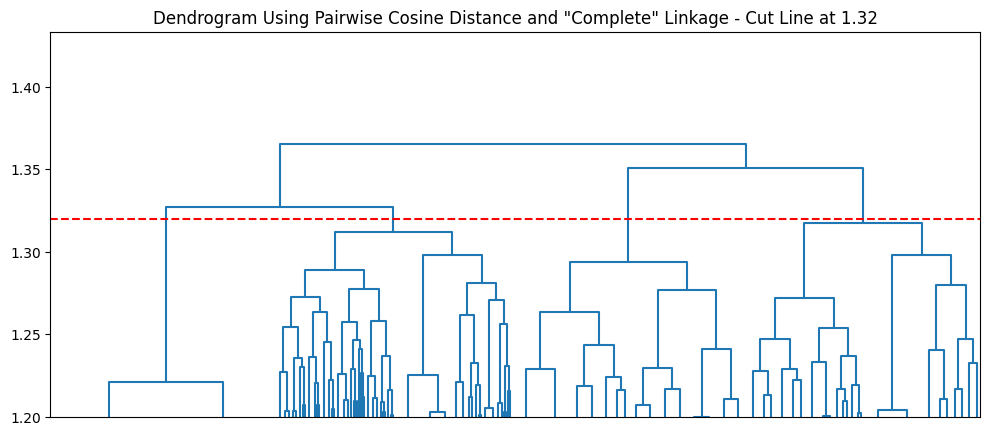

array([25501,  9992,  9860,  5189])

In [47]:
complete_labels = fcluster(complete_distance_Z, t=1.32, criterion='distance') - 1 # scipy labels start at 1
elements, counts = np.unique(complete_labels, return_counts=True)

plt.figure(figsize=(12, 5))
dendrogram(complete_distance_Z, truncate_mode='level', p=10)
plt.axhline(y=1.32, color='r', linestyle='--')  # cut line
plt.xticks([])
plt.ylim(1.2)
plt.title('Dendrogram Using Pairwise Cosine Distance and "Complete" Linkage - Cut Line at 1.32')
plt.show()

np.sort(counts)[::-1][:10]

In [48]:
distance_matrix = squareform(distance_vector)

In [49]:
def sub_sample_silhouette(X, labels, full_square, sample_size=5000, seed=42):
    n_samples = len(labels)

    rng = np.random.default_rng(seed)
    sample_indices = rng.choice(n_samples, size=sample_size, replace=False)
    sample_indices.sort()
    sample_labels = labels[sample_indices]

    # Subset the square matrix
    sample_square = full_square[np.ix_(sample_indices, sample_indices)]

    # Compute silhouette scores
    sample_scores = silhouette_samples(sample_square, sample_labels, metric='precomputed')

    # Compute t-SNE
    X_sample = X[sample_indices]
    sample_tsne = get_tsne(X_sample)
    
    return sample_scores, sample_labels, sample_tsne

In [50]:
def plot_tree_performance(sample_silhouette_values, cluster_labels, X_embedded, title=None):
    n_clusters = len(np.unique(cluster_labels))
    silhouette_avg = sample_silhouette_values.mean()

    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    y_lower = 10
    colors = {}
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        colors[i] = color
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title(f'The silhouette plot for the various clusters. Average={silhouette_avg:.4f}')
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    # Assign a color to each point based on its cluster label
    colors = [colors[int(label)] for label in cluster_labels]
    ax2.scatter(X_embedded[:, 0], X_embedded[:, 1], c=colors, alpha=0.7, s=5)
    ax2.set_title('t-SNE Transformed Clusters')
    

    plt.suptitle(
        title,
        fontsize=14,
        fontweight="bold",
    )

    plt.show()

In [51]:
average_subsample_scores, average_subsample_labels, average_subsample_tsne = sub_sample_silhouette(survey_df_dropped_no_scaled, average_dist_labels, distance_matrix)

In [52]:
complete_subsample_scores, complete_subsample_labels, complete_subsample_tsne = sub_sample_silhouette(survey_df_dropped_no_scaled, complete_labels, distance_matrix)

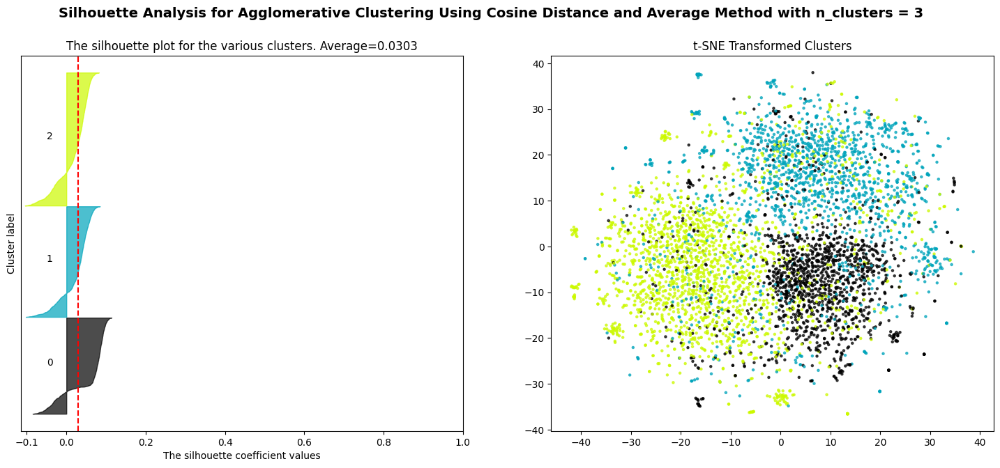

In [53]:
plot_tree_performance(average_subsample_scores, average_subsample_labels, average_subsample_tsne,
                      title='Silhouette Analysis for Agglomerative Clustering Using Cosine Distance and Average Method with n_clusters = 3')

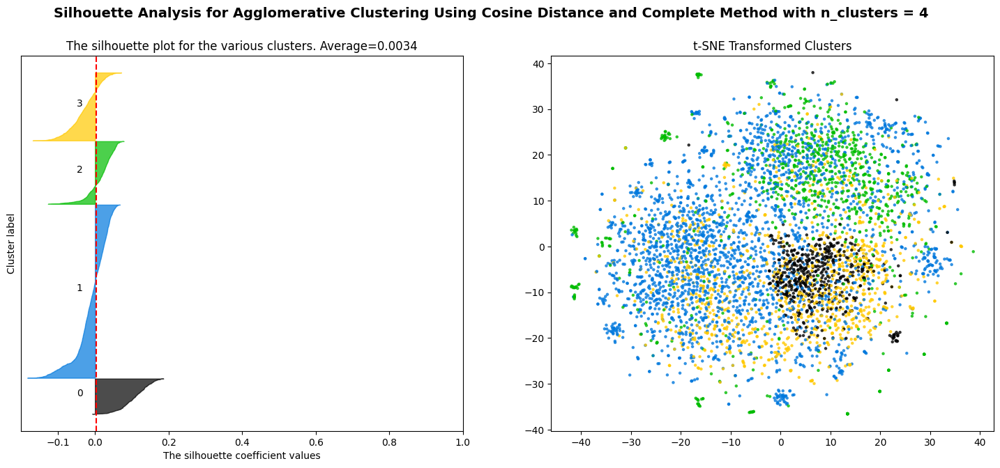

In [54]:
plot_tree_performance(complete_subsample_scores, complete_subsample_labels, complete_subsample_tsne,
                      title='Silhouette Analysis for Agglomerative Clustering Using Cosine Distance and Complete Method with n_clusters = 4')

# Identifying most impactful features using random forest Using Best Clusters 

using pc_10 Kmeans n=3

In [55]:
kmeans_labels = KMeans(n_clusters=3).fit_predict(pc_10)

In [56]:
kmeans_forest = RandomForestClassifier().fit(survey_df_dropped_no_scaled, kmeans_labels)

In [57]:
kmeans_importances = kmeans_forest.feature_importances_

In [58]:
kmeans_importances = pd.Series(kmeans_importances, index=survey_df_dropped_no.columns)

In [59]:
kmeans_top_10 = kmeans_importances.sort_values(ascending=False)[:10]

In [60]:
for label in kmeans_top_10.index:
    q, a = question_answer(label)
    print(f'question: {q} \nanswer: {a}\n')

question: x33 Which one of these reasons best describes this most recent mortgage? 
answer: 1

question: x34b Did you do the following before or after you made an offer on this house or property? | Got a pre-approval or pre-qualification from a lender (Waves 7-34) 
answer: 1

question: x37b How important were the following in your decision to refinance, modify, or obtain a new mortgage? | Get a lower interest rate (Waves 7-34) 
answer: 1

question: x33 Which one of these reasons best describes this most recent mortgage? 
answer: 2

question: x34c Did you do the following before or after you made an offer on this house or property? | Decided on the typeof loan (Waves 7-34) 
answer: 1

question: x17a How important were each of the following in determining the mortgage you took out? | Lower interest rate (Waves 7-34) 
answer: 1

question: x49 Were the loan costs you paid similar to what you had expected to pay based on the Loan Estimates or Closing Disclosures you received? (Waves 11-34) 

In [61]:
# Producing a dataframe of kmeans top questions and labels
kmeans_df = survey_df[kmeans_top_10.index]
kmeans_df['labels'] = kmeans_labels

/var/folders/sq/6vts8v4d14n3r_m4sp3mn19w0000gn/T/ipykernel_38587/482879607.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  kmeans_df['labels'] = kmeans_labels


In [62]:
grouped_kmeans = kmeans_df.groupby('labels')
grouped_kmeans.sum()

,x33_1,x34b_1,x37b_1,x33_2,x34c_1,x17a_1,x49_1,x17b_1,x17c_1,x34a_1
labels,,,,,,,,,,
0,5948,117,460,6451,109,680,14,488,445,92
1,17374,14378,120,117,11469,17059,13418,15238,14586,12142
2,68,22,18084,18646,27,19767,15635,17705,16837,17


In [63]:
kmeans_df['labels'].value_counts().sort_index()

labels
0    12892
1    17557
2    20093
Name: count, dtype: int64

In [78]:
k_label_0 = [0, 3]
k_label_1 = [0, 1, 4, 5, 6, 7, 8, 9]
k_label_2 = [2, 3, 5, 6, 7, 8]

In [ ]:
# This cluster represents buyers in less desirable markets or refinances in distress
# Will be evidenced through further exploration below

for i in k_label_0:
    q, a = question_answer(kmeans_top_10.index[i])
    print(f'question: {q} \nanswer: {a}\n')

question: x33 Which one of these reasons best describes this most recent mortgage? 
answer: 1

question: x33 Which one of these reasons best describes this most recent mortgage? 
answer: 2



In [ ]:
# This cluster represents borrowers buying a home

for i in k_label_1:
    q, a = question_answer(kmeans_top_10.index[i])
    print(f'question: {q} \nanswer: {a}\n')

question: x33 Which one of these reasons best describes this most recent mortgage? 
answer: 1

question: x34b Did you do the following before or after you made an offer on this house or property? | Got a pre-approval or pre-qualification from a lender (Waves 7-34) 
answer: 1

question: x34c Did you do the following before or after you made an offer on this house or property? | Decided on the typeof loan (Waves 7-34) 
answer: 1

question: x17a How important were each of the following in determining the mortgage you took out? | Lower interest rate (Waves 7-34) 
answer: 1

question: x49 Were the loan costs you paid similar to what you had expected to pay based on the Loan Estimates or Closing Disclosures you received? (Waves 11-34) 
answer: 1

question: x17b How important were each of the following in determining the mortgage you took out? | Lower APR (Annual Percentage Rate) (Waves 7-34) 
answer: 1

question: x17c How important were each of the following in determining the mortgage you t

In [ ]:
# This cluster represents borrowers refinancing for lower rates

for i in k_label_:
    q, a = question_answer(kmeans_top_10.index[i])
    print(f'question: {q} \nanswer: {a}\n')

question: x37b How important were the following in your decision to refinance, modify, or obtain a new mortgage? | Get a lower interest rate (Waves 7-34) 
answer: 1

question: x33 Which one of these reasons best describes this most recent mortgage? 
answer: 2

question: x17a How important were each of the following in determining the mortgage you took out? | Lower interest rate (Waves 7-34) 
answer: 1

question: x49 Were the loan costs you paid similar to what you had expected to pay based on the Loan Estimates or Closing Disclosures you received? (Waves 11-34) 
answer: 1

question: x17b How important were each of the following in determining the mortgage you took out? | Lower APR (Annual Percentage Rate) (Waves 7-34) 
answer: 1

question: x17c How important were each of the following in determining the mortgage you took out? | Lower closing fees (Waves 7-34) 
answer: 1



In [68]:
label_df = survey_df_dropped_no.copy()

In [69]:
label_df['label'] = kmeans_labels

In [70]:
grouped_df = label_df.drop('x74r', axis=1).groupby('label')

In [71]:
pd.set_option('display.max_columns', None)

grouped_means = grouped_df.mean() * 100
grouped_means

,x05a_1,x05a_2,x05a_3,x05b_1,x05b_2,x05b_3,x05c_1,x05c_2,x05c_3,x05d_1,x05d_2,x05d_3,x05e_1,x05e_2,x05e_3,x05f_1,x05f_2,x05f_3,x05g_1,x05g_2,x05g_3,x06_1,x06_2,x06_3,x07_1,x07_2,x07_3,x08a_1,x08a_2,x08a_3,x08b_1,x08b_2,x08b_3,x08c_1,x08c_2,x08c_3,x08d_1,x08d_2,x08d_3,x08e_1,x08e_2,x08e_3,x08f_1,x08f_2,x08f_3,x08g_1,x08g_2,x08g_3,x08h_1,x08h_2,x08h_3,x08i_1,x08i_2,x08i_3,x09_1,x10_1,x10_2,x10_3,x11_1,x11_2,x11_3,x11_4,x11_5,x12_1,x12_2,x12_3,x12_4,x12_5,x13a_1,x13b_1,x13c_1,x13d_1,x14a_1,x14b_1,x14c_1,x14d_1,x14e_1,x14f_1,x14g_1,x14h_1,x14i_1,x14j_1,x14k_1,x15_1,x15_2,x15_3,x16_1,x16_2,x16_3,x17a_1,x17b_1,x17c_1,x17d_1,x17e_1,x17f_1,x17g_1,x17h_1,x18_1,x19_1,x20a_1,x20b_1,x20c_1,x20d_1,x20e_1,x20f_1,x20g_1,x20h_1,x20i_1,x20j_1,x21a_1,x21b_1,x22a_1,x22b_1,x22c_1,x23a_1,x23b_1,x23c_1,x23d_1,x23e_1,x23f_1,x23g_1,x23h_1,x23i_1,x23j_1,x24a_1,x24b_1,x24c_1,x24z_1,x25_1,x26_1,x26_2,x26_3,x27a_1,x27a_2,x27a_3,x27b_1,x27b_2,x27b_3,x27c_1,x27c_2,x27c_3,x28a_1,x28a_2,x28a_3,x28b_1,x28b_2,x28b_3,x28c_1,x28c_2,x28c_3,x28d_1,x28d_2,x28d_3,x28e_1,x28e_2,x28e_3,x28f_1,x28f_2,x28f_3,x28g_1,x28g_2,x28g_3,x28h_1,x28h_2,x28h_3,x29_1,x30a_1,x30b_1,x30c_1,x30d_1,x30e_1,x31_1,x31_2,x31_3,x31_4,x32_1,x32_2,x32_3,x33_1,x33_2,x33_3,x33_4,x33_5,x34a_1,x34a_2,x34a_3,x34b_1,x34b_2,x34b_3,x34c_1,x34c_2,x34c_3,x34d_1,x34d_2,x34d_3,x34e_1,x34e_2,x34e_3,x36a_1,x36b_1,x36c_1,x36d_1,x36e_1,x36f_1,x37a_1,x37b_1,x37c_1,x37d_1,x37e_1,x37f_1,x37g_1,x40a_1,x40b_1,x40c_1,x40d_1,x40e_1,x40f_1,x40g_1,x40h_1,x40x_1,x40z_1,x44_1,x45_1,x45_2,x45_3,x46a_1,x46b_1,x46c_1,x46d_1,x46e_1,x48a_1,x48b_1,x48c_1,x48d_1,x48x_1,x48z_1,x49_1,x50a_1,x50b_1,x50c_1,x50d_1,x50e_1,x50f_1,x50g_1,x5001_1,x5001_2,x5001_3,x5001_4,x51a_1,x51a_2,x51a_3,x51b_1,x51b_2,x51b_3,x51c_1,x51c_2,x51c_3,x51d_1,x51d_2,x51d_3,x53a_1,x53b_1,x53c_1,x53d_1,x53e_1,x53f_1,x53g_1,x53h_1,x53i_1,x54_1,x56a_1,x56a_2,x56a_3,x56b_1,x56b_2,x56b_3,x56c_1,x56c_2,x56c_3,x56d_1,x56d_2,x56d_3,x56e_1,x56e_2,x56e_3,x56f_1,x56f_2,x56f_3,x56g_1,x56g_2,x56g_3,x56h_1,x56h_2,x56h_3,x56i_1,x56i_2,x56i_3,x59_1,x59_2,x59_3,x59_4,x59_5,x59_6,x59_7,x59_8,x59_9,x59_10,x60_1,x60_2,x60_3,x60_4,x60_5,x60_6,x60_7,x61_1,x63_1,x65_1,x66_1,x66_2,x66_3,x66_4,x66_5,x6701_1,x6701_2,x6701_3,x6701_4,x68a_1,x68a_2,x68a_3,x68b_1,x68b_2,x68b_3,x68c_1,x68c_2,x68c_3,x68d_1,x68d_2,x68d_3,x68e_1,x68e_2,x68e_3,x68f_1,x68f_2,x68f_3,x69_1,x69_2,x69_3,x69_4,x69_5,x70_1,x70_2,x70_3,x71a_1,x71a_2,x71a_3,x71b_1,x71b_2,x71b_3,x71c_1,x71c_2,x71c_3,x71d_1,x71d_2,x71d_3,x72_1,x72_2,x72_3,x72_4,x72_5,x73_1,x75r_1,x76r_1,x76r_2,x76r_3,x76r_4,x76r_5,x76r_6,x76s_1,x76s_2,x76s_3,x76s_4,x76s_5,x76s_6,x77r_1,x78r_1,x78r_2,x78r_3,x78r_4,x79ra_1,x79ra_2,x79ra_3,x79ra_4,x79ra_5,x79ra_6,x79ra_7,x79rb_2,x79rb_4,x79rb_5,x79rb_6,x79sa_1,x79sa_2,x79sa_3,x79sa_4,x79sa_5,x79sa_6,x79sa_7,x79sb_2,x79sb_4,x79sb_5,x79sb_6,x80r_1,x80r_2,x80r_3,x80r_4,x80s_1,x80s_2,x80s_3,x80s_4,x81a_1,x81b_1,x81c_1,x81d_1,x81e_1,x81f_1,x81z_1,x82_1,x8201_1,x8202_1,x83_1,x83_2,x83_3,x83_4,x83_5,x83_6,x84_1,x84_2,x84_3,x85a_1,x85b_1,x85c_1,x85d_1,x85e_1,x86a_1,x86b_1,x86c_1,x86d_1,x87_1,x87_2,x87_3,x87_4,x88a_1,x88b_1,x88c_1,x88d_1,x88e_1,x88f_1,x88g_1,x89a_1,x89b_1,x89c_1,x89d_1,x89e_1,x89f_1,x89g_1,x89h_1,x89i_1,x89j_1,x90a_1,x90b_1,x90c_1,x90d_1,x90e_1,x90f_1,x90g_1,x91a_1,x91a_2,x91a_3,x91b_1,x91b_2,x91b_3,x91c_1,x91c_2,x91c_3,x92a_1,x92a_2,x92a_3,x92b_1,x92b_2,x92b_3,x92c_1,x92c_2,x92c_3,x93a_1,x93a_2,x93a_3,x93b_1,x93b_2,x93b_3,x93c_1,x93c_2,x93c_3,x93d_1,x93d_2,x93d_3,x94a_1,x94a_2,x94a_3,x94b_1,x94b_2,x94b_3,x94c_1,x94c_2,x94c_3,x94d_1,x94d_2,x94d_3
label,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,

In [72]:
# Get the number of clusters
clusters = label_df['label'].unique()

# Create a structure to hold results
results = {}

for cluster in clusters:
    this_cluster = grouped_means.loc[cluster]
    other_clusters = grouped_means.drop(index=cluster).mean()
    
    diff = this_cluster - other_clusters
    results[cluster] = diff.sort_values(ascending=False)  # Most over-represented at top

# Convert to DataFrame for inspection
diff_df = pd.DataFrame(results)

In [82]:
cluster_0_differences = diff_df[0].sort_values(key=abs, ascending=False)

In [ ]:
# Exploring answers very different for borrowers in cluster 0

for label, value in cluster_0_differences[:20].items():
    q, a = question_answer(label)
    print(f'question: {q} \nanswer: {a}\nDifference: {value}\n')

question: x17a How important were each of the following in determining the mortgage you took out? | Lower interest rate (Waves 7-34) 
answer: 1
Difference: -92.49594557695798

question: x17f How important were each of the following in determining the mortgage you took out? | An interest rate fixedfor the life of the loan (Waves 7-34) 
answer: 1
Difference: -85.51765060837513

question: x17b How important were each of the following in determining the mortgage you took out? | Lower APR (Annual Percentage Rate) (Waves 7-34) 
answer: 1
Difference: -83.668135354445

question: x17c How important were each of the following in determining the mortgage you took out? | Lower closing fees (Waves 7-34) 
answer: 1
Difference: -79.98491008087669

question: x49 Were the loan costs you paid similar to what you had expected to pay based on the Loan Estimates or Closing Disclosures you received? (Waves 11-34) 
answer: 1
Difference: -77.01066860907663

question: x17e How important were each of the follow

In [84]:
cluster_0_differences = diff_df[0].sort_values(ascending=False)

In [86]:
# Exploring answers more common in cluster 0

for label, value in cluster_0_differences[:20].items():
    q, a = question_answer(label)
    print(f'question: {q} \nanswer: {a}\nDifference: {value}\n')

question: x68f In the last couple years, how have the following changed in the neighborhood where this property is located?| Overall desirability of living there 
answer: 2
Difference: 18.665439655670696

question: x68e In the last couple years, how have the following changed in the neighborhood where this property is located?| House prices 
answer: 2
Difference: 15.615869324380967

question: x70 In the next couple of years, how do you expect the overall desirability of living in this neighborhood to change? 
answer: 2
Difference: 15.513368466395022

question: x68e In the last couple years, how have the following changed in the neighborhood where this property is located?| House prices 
answer: 3
Difference: 10.337598847236752

question: x68d In the last couple years, how have the following changed in the neighborhood where this property is located?| Number of foreclosures or short sales 
answer: 1
Difference: 10.30129633427931

question: x68b In the last couple years, how have the fol